#**Introduction to Image Processing in Python**
An NCSU Libraries Workshop

Speaker: Nian Xiong

>This workshop provides an introduction to basic image processing techniques using the OpenCV computer vision library and some standard data analysis libraries in Python. Knowledge of image processing and Python programming is not required for this workshop, but will help.

*The source of this notebook is located at https://github.com/xn2333/OpenCV/blob/master/Seminar_Image_Processing_in_Python.ipynb*

*Useful intro about [Colab](https://colab.research.google.com/notebooks/welcome.ipynb)*

*Useful intro about [OpenCV](https://opencv.org/)*








##Step1: Load the Dependencies

> This section loads some required libraries used in this notebook: **numpy**, **pandas**, **cv2**, **skimage**, **PIL**, **matplotlib**

*   [Numpy](https://www.numpy.org/) is an array manipulation library, used for linear algebra, Fourier transform, and random number capabilities.
*   [Pandas](https://pandas.pydata.org/) is a library for data manipulation and data analysis.
*   [CV2](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_gui/py_image_display/py_image_display.html) is a library for computer vision tasks.
*   [Skimage](https://scikit-image.org/) is a library which supports image processing applications on python.
*   [Matplotlib](https://matplotlib.org/) is a library which generates figures and provides graphical user interface toolkit.









In [1]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

##Step2: Read Image from Urls

> In this step we will read images from urls, and display them using openCV, please note the difference when reading image in RGB and BGR format. The default input color channels are in BGR format for openCV.

RGB?

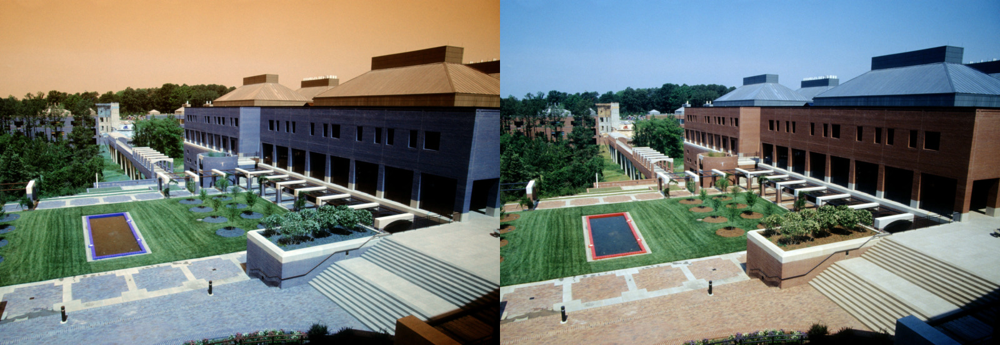

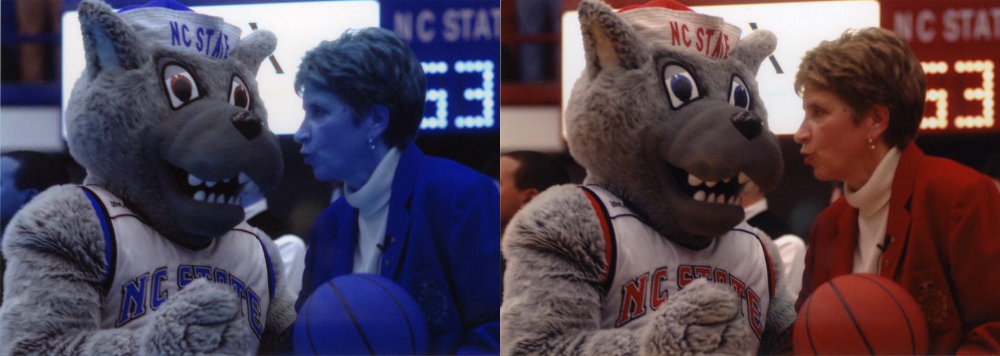

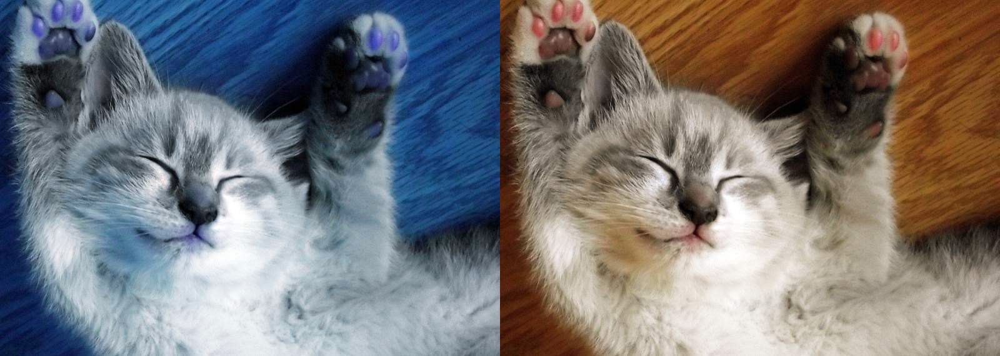

In [2]:
# Create a list to store the urls of the images
urls = ["https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg",
       "https://iiif.lib.ncsu.edu/iiif/0016007/full/800,/0/default.jpg",
      "https://placekitten.com/800/571"]  
# Read and display the image
# loop over the image URLs, you could store several image urls in the list

for url in urls:
  image = io.imread(url) 
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
  final_frame = cv.hconcat((image, image_2))
  cv2_imshow(final_frame)
  print('\n')

#### TODO #1: Read an image from a URL and display it

Image source examples:

[Place Kitten](https://placekitten.com/) - use the base Place Kitten URL followed by a width and height separated by backslashes ''/''. For example, use the URL `https://placekitten.com/500/300` to fetch a cat image with a width of 500px and height of 300px.

[NC State University Libraries Special Collections](https://d.lib.ncsu.edu/collections/catalog) - browse the site to find an image thumbnail. Right-click on the thumbnail and select "Copy Image Address". The address will look like this: `https://iiif.lib.ncsu.edu/iiif/0051230/square/300,/0/default.jpg`. Replace the word "square" with the word "full" and replace "300" with "800" to access the full image at a width of 800px.

[Google Image search](https://www.google.com/imghp?hl=en) - search for an image. Left-click one of the returned images, then right-click on the full image, and then select "Copy Image Address".

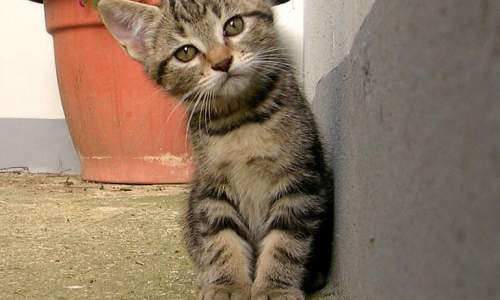

In [ ]:
## TODO: LOAD IMAGE
url = "https://placekitten.com/500/300"
myImg = io.imread(url)  
cv2_imshow(cv.cvtColor(myImg, cv.COLOR_BGR2RGB))


##Step3: Image Contours and Histograms

In [ ]:
# Check the image matrix data type (could know the bit depth of the image)
print(image.dtype)
# Check the height of image 
print(image.shape[0])
# Check the width of image 
print(image.shape[1])
# Check the number of channels of the image
print(image.shape[2])

uint8
571
800
3


### Generate Histogram of color image and grayscale image
Sometimes you want to enhance the contrast in your image or expand the contrast in a particular region while sacrificing the detail in colors that don’t vary much, or don’t matter. A good tool to find interesting regions is the histogram. To create a histogram of our image data, we use the matplot.pylab `hist()` function.

More info: [Histogram](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_histograms/py_table_of_contents_histograms/py_table_of_contents_histograms.html)

Display the histogram of all the pixels in the color image

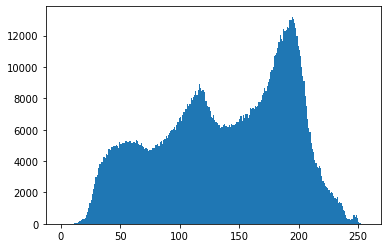

In [ ]:
plt.hist(image.ravel(),bins = 256, range = [0,256]) 
plt.show()

Display the histogram of R, G, B channel
We could observe that the green channel has many pixels in 255, which represents the white patch in the image

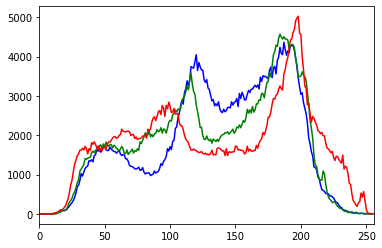

In [ ]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv.calcHist([image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

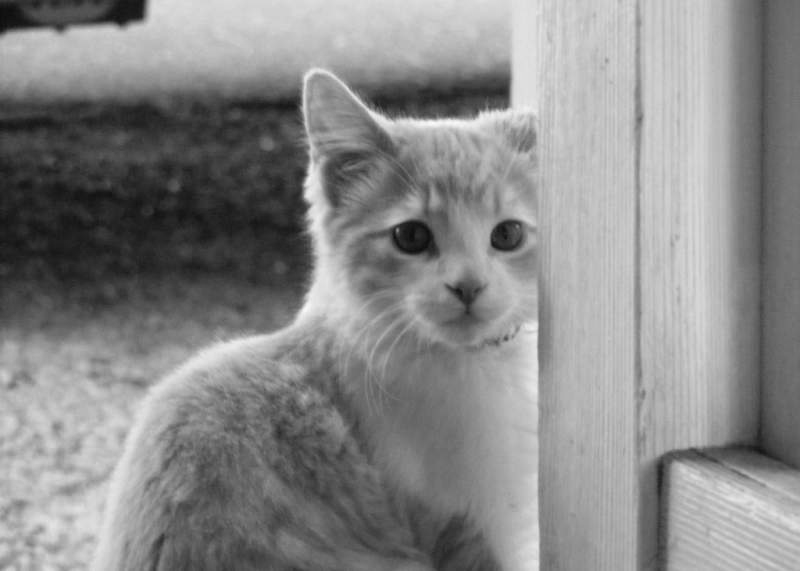

In [ ]:
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

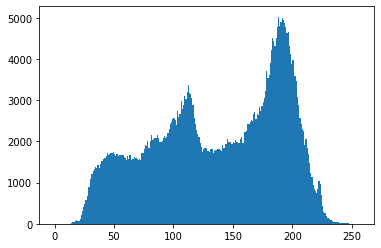

In [ ]:
# Plot the histogram of the gray image. We could observe that the frequency of
# the image hist has decreased ~ 1/3 of the histogram of color image
plt.hist(gray_image.ravel(),bins = 256, range = [0, 256])
plt.show()

 #### TODO # 2: DISPLAY THE GRAYSCALE OF YOUR COLOR IMAGE AND GENERATE HISTOGRAM


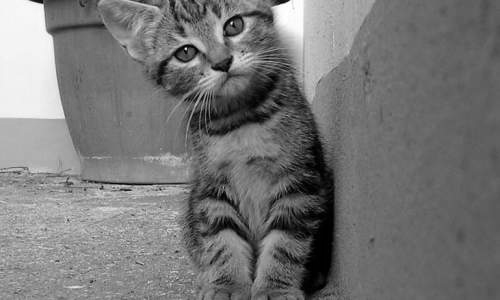

In [ ]:
myGrayImg = cv.cvtColor(myImg, cv.COLOR_BGR2GRAY)
cv2_imshow(myGrayImg)

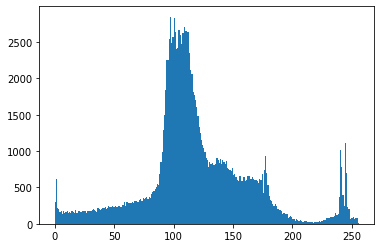

In [ ]:
plt.hist(myGrayImg.ravel(),bins = 256, range = [0, 256])
plt.show()

### Find image contour of the grayscale image

Method 1: Use the matplotlib. contour

More Info: [matplotlib contour](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.contour.html)

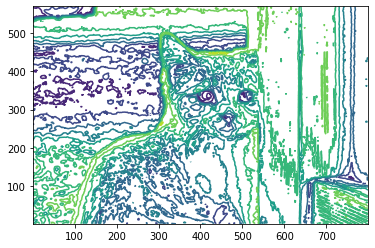

In [ ]:
plt.contour(gray_image, origin = "image")

Method 2: Use the openCV lib

More info: [Contour](https://docs.opencv.org/3.1.0/d4/d73/tutorial_py_contours_begin.html)

In [ ]:
# Set threshold for the countour detection
ret, thresh = cv.threshold(gray_image,150,255,0)
im2, contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(image, contours, -1, (0, 255, 0), 3)
plt.imshow(image)

ValueError: ignored

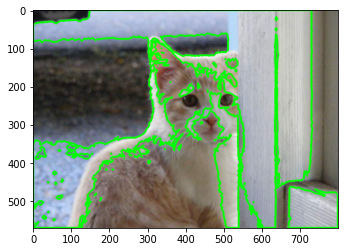

In [ ]:
# Set threshold for the countour detection
# https://docs.opencv.org/4.x/d3/dc0/group__imgproc__shape.html#gadf1ad6a0b82947fa1fe3c3d497f260e0
ret, thresh = cv.threshold(gray_image, 150,255,0)
# findContours returns contours, hierarchy
contours, hierarchy = cv.findContours(thresh,cv.RETR_TREE,cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(image, contours, -1, (0, 255, 0), 3)
plt.imshow(image)

#### TODO # 3: Find the contour of your own image

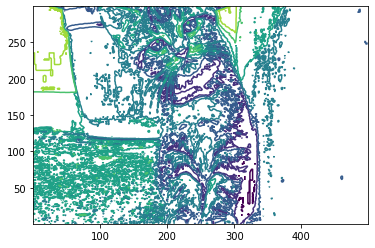

In [ ]:
# Your code
plt.contour(myGrayImg, origin = "image")

##Step4: Grayscale Transform and Histogram Equalization


### Grayscale Transformation
This section provides some examples of conducting mathematical transformations of the grayscale image

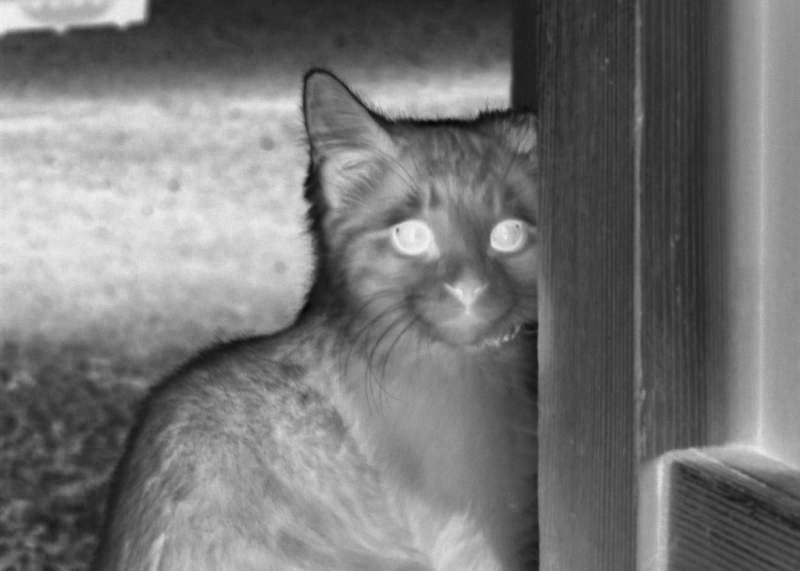

In [ ]:
# This is an inverse operation of the grayscale image, you could see that the
# bright pixels become dark, and the dark pixels become bright
im2 = 255 - gray_image
cv2_imshow(im2)

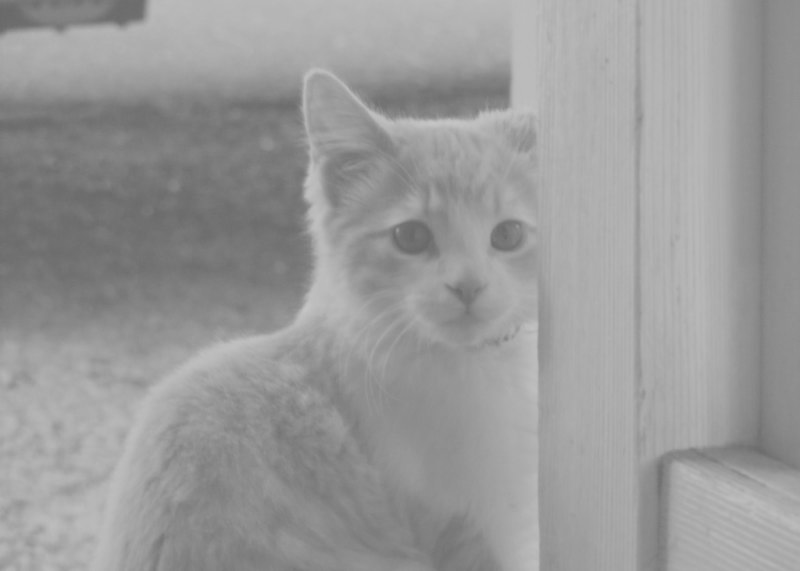

In [ ]:
# Another transform of the image, after adding a constant, 
# all the pixels become brighter and a hazing-like effect of the image is generated
im3 = (100.0/255)*gray_image + 100
cv2_imshow(im3)

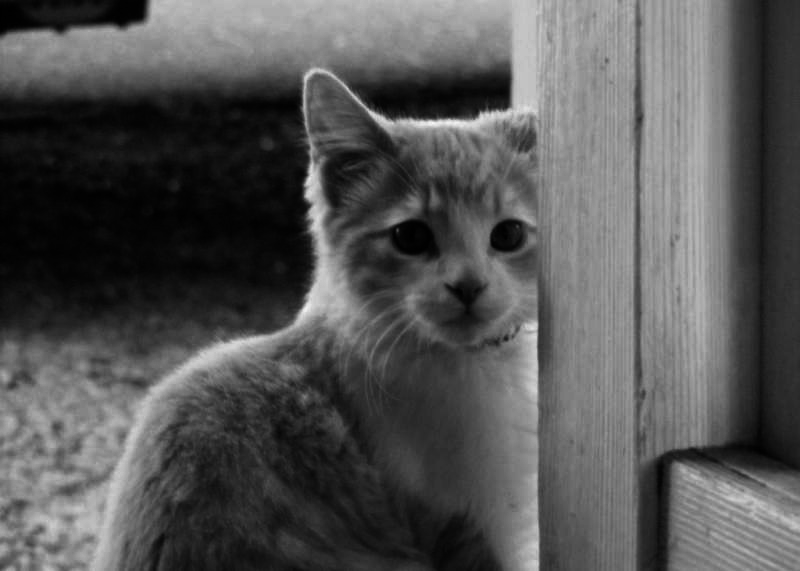

In [ ]:
# The lightness level of the gray_image decreases after this step
im4 = 255.0*(gray_image/255.0)**2
cv2_imshow(im4)

#### TODO #4:  Try some mathematical operations on your image


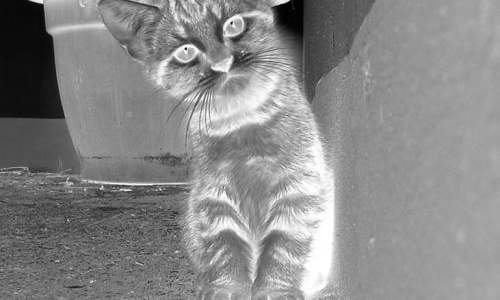

In [ ]:
## Implement your code here
myGrayImgTrans = 255-myGrayImg
cv2_imshow(myGrayImgTrans)


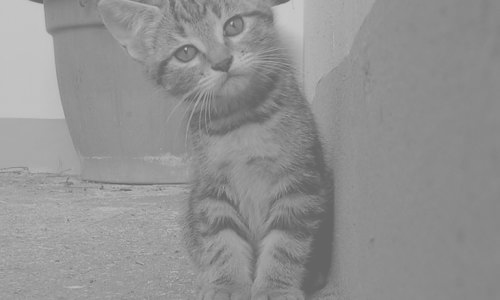

In [ ]:
myGrayImgTrans2 = (100.0/255)*myGrayImg + 100
cv2_imshow(myGrayImgTrans2)

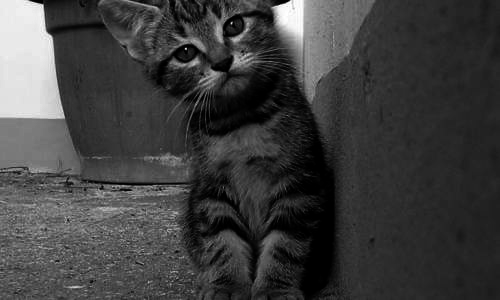

In [ ]:
myGrayImgTrans3 = 255.0*(myGrayImg/255.0)**2
cv2_imshow(myGrayImgTrans3)

### Histogram Equalization
This section demonstrates histogram equalization on a dark image. This transform flattens the gray-level histogram so that all intensities are as equally common as possible. The transform function is a cumulative distribution function (cdf) of the pixel values in the image (normalized to map the range of pixel values to the desired range). This example uses image 4 (im4).

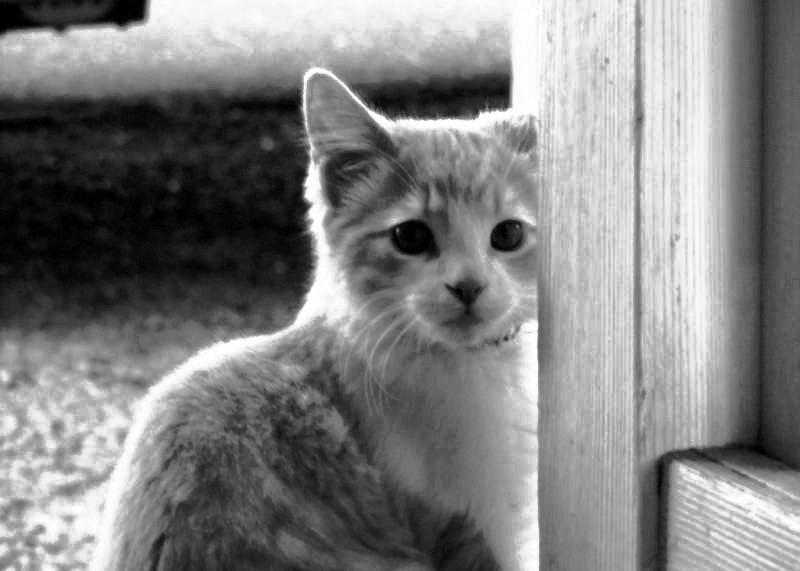

In [ ]:
# function of histogram equalization
def histeq(im, nbr_bins = 256):
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]

# apply the function on your dark image to increase the contrast
# we could observe that the contrast of the black background has increased
im5 = histeq(im4)
cv2_imshow(im5)

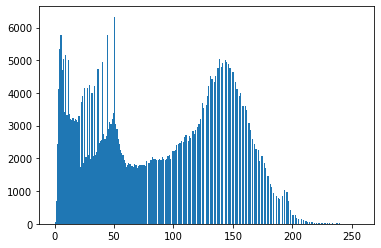

In [ ]:
# Extra: try to visualize the histogram of the image after histogram equalization
# Before histogram equalization
plt.hist(im4.ravel(),bins = 256, range = [0, 256])
plt.show()

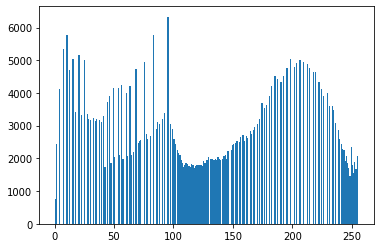

In [ ]:
# After histogram equalization
plt.hist(im5.ravel(),bins = 256, range = [0, 256])
plt.show()

#### TODO # 5: Do a histogram equalization on your grayscale image



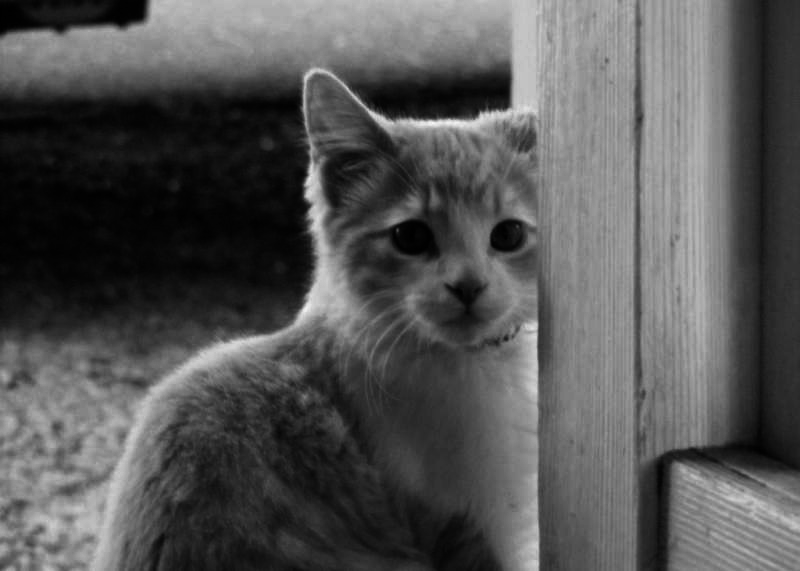

In [ ]:
## TODO: IMPLEMENT YOUR CODE HERE

myGrayImgTrans4 = histeq(myGrayImgTrans3)
cv2_imshow(im4)

##plt.imshow()

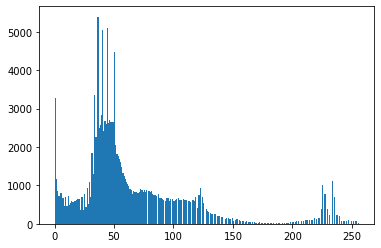

In [ ]:
# Before histogram equalization
plt.hist(myGrayImgTrans3.ravel(),bins = 256, range = [0, 256])
plt.show()

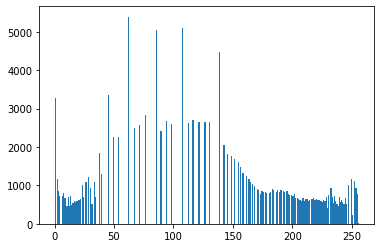

In [ ]:
# After histogram equalization
plt.hist(myGrayImgTrans4.ravel(),bins = 256, range = [0, 256])
plt.show()

##Step5: Fourier Transform of Gray Images
[FFT](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_transforms/py_fourier_transform/py_fourier_transform.html)
> A fourier transform is used to find the frequency domian of an image. You can consider an image as a signal which is sampled in two directions. So taking a fourier transform in both X and Y directions gives you the frequency representation of image. For the sinusoidal signal, if the amplitude varies so fast in short time, you can say it is a high frequency signal. If it varies slowly, it is a low frequency signal. Edges and noises are high frequency contents in an image because they change drastically in images.

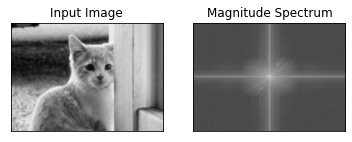

In [ ]:
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur = cv.blur(gray_image,(5,5))
# Transform the image to frequency domain
f = np.fft.fft2(imBlur)
# Bring the zero-frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

### TODO # 6: Generate a fourier transform of your grayscale image

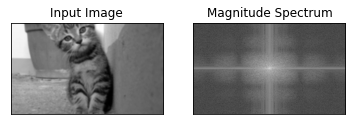

In [ ]:
# Blur the grascale image by a Gaussian filter with kernel size of 10
imBlur = cv.blur(myGrayImg, (5,5))
# Transform the image to frequency domain
f = np.fft.fft2(imBlur)
# Bring the zero-frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()


## Step6: Finding Edges by Highpass Filtering in FFT

This section demonstrates conducting a high pass filter to remove the low frequency component, resulting in a sharpened image which contains the edges

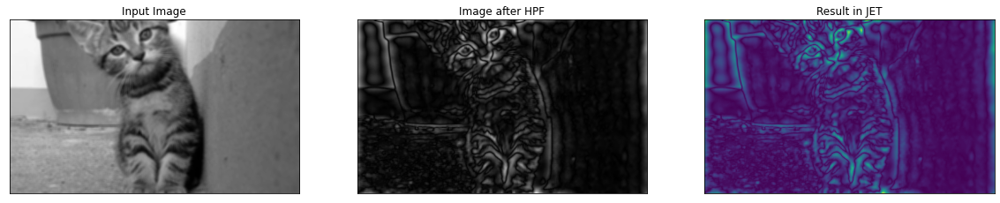

In [ ]:
rows, cols = imBlur.shape
crow,ccol = round(rows/2) , round(cols/2)
# remove low frequencies with a rectangle size of 10
fshift[crow-10:crow+10, ccol-10:ccol+10] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plt.figure(figsize=([20, 20]))
plt.subplot(131),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back)
plt.title('Result in JET'), plt.xticks([]), plt.yticks([])
plt.show()

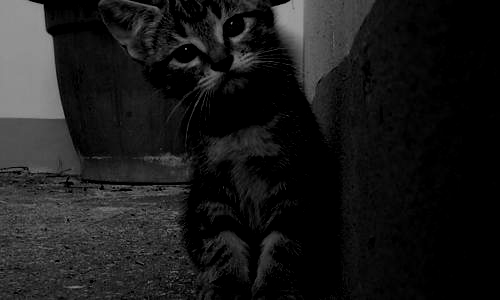

In [ ]:
myGrayImgTrans5 = myGrayImg + (-100)
cv2_imshow(myGrayImgTrans5)

#**Negativo de una imagen**
De acuerdo con The AI Learner (s.f.), para transformar una imagen a negativo se utiliza la formula siguiente: <br/>
`s = T(r) = L-1-r` <br/>

Donde `L-1` es el valor máximo de la intensidad del pixel y `r` los valores originales de los pixeles de la imagen.


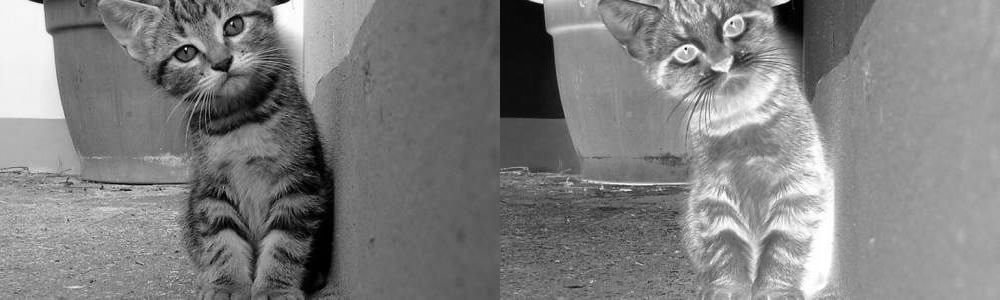

In [ ]:
negImg = 255 - myGrayImg
final_frame = cv.hconcat((myGrayImg, negImg))
cv2_imshow(final_frame)

En la fotografía tradicional, las imágenes en negativo se utilizan para realizar el "positivado" en papel; es decir, las partes del negativo, en las que ha incidido la luz son convertidas a tonos obscuros, mientras que aquellos donde no ha incidido se vuelven a tonalidades claras (Wikipedia, s.f.)

#**Gamma Correction**
De acuerdo con Lindevs (2022), `Gamma correction` es un método que permite controlar el brillo de una imagen. La fórmula está dada por: <br/><br/> 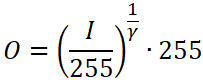

Donde:
* `I` es el valor del pixel de entrada [0,255].
* `O` es el valor del pixel de salida [0,255].
* `γ` es el valor gamma que controla el brillo. Si gamma es <1 entonces la imagen será más obscura; por el contrario, si la gamma es >1 entonces la imagen tendrá más brillo. Igualmente, un gamma =1 no tiene ningún efecto sobre la imagen.

El algoritmo convierte los valores originales de los pixels del rango [0, 255] a una escala de [0, 1.0]. Después, de la aplicación de los cálculos, los valores son regresados a una escala de [0, 255]. En este caso se utiliza una `lookup table (LUT)`, que provee la función `LUT` de la librería OpenCV, para mapear los valores de los pixeles de entrada con los valores de los pixeles de salida (Lindevs, 2022).

In [ ]:
# Implementación de Gamma Correction. Fuente: Lindevs
def gammaCorrection(src, gamma):
    invGamma = 1 / gamma

    table = [((i / 255) ** invGamma) * 255 for i in range(256)]
    table = np.array(table, np.uint8)

    return cv.LUT(src, table)

* Gamma con valor menor a 1, en este caso 0.5, produce una image con menos brillo.

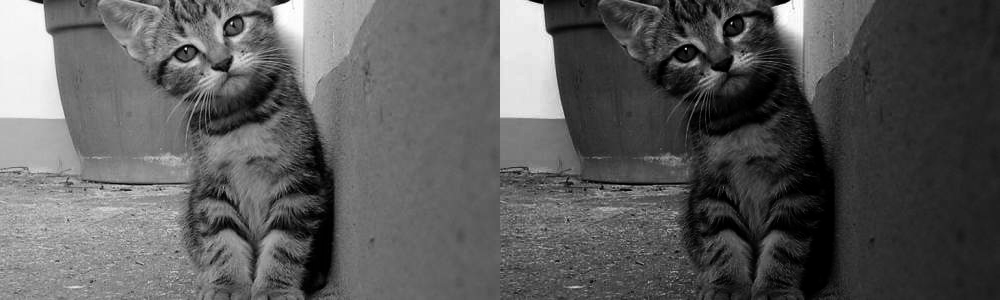

In [ ]:
gammaImg1 = gammaCorrection(myGrayImg, 0.5)
final_frame = cv.hconcat((myGrayImg, gammaImg1))
cv2_imshow(final_frame)

* Gamma con valor mayor a 1, en este caso 2, produce una image con menos brillo.

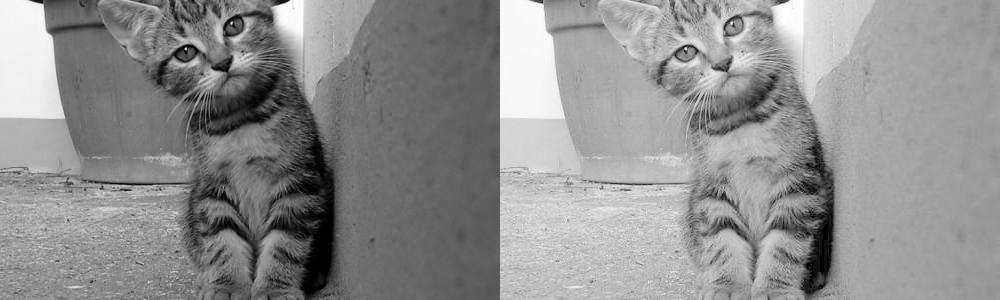

In [ ]:
gammaImg2 = gammaCorrection(myGrayImg, 2)
final_frame = cv.hconcat((myGrayImg, gammaImg2))
cv2_imshow(final_frame)

* Gamma con valor igual a 1 no genera ningún cambio en el brillo de la imagen.

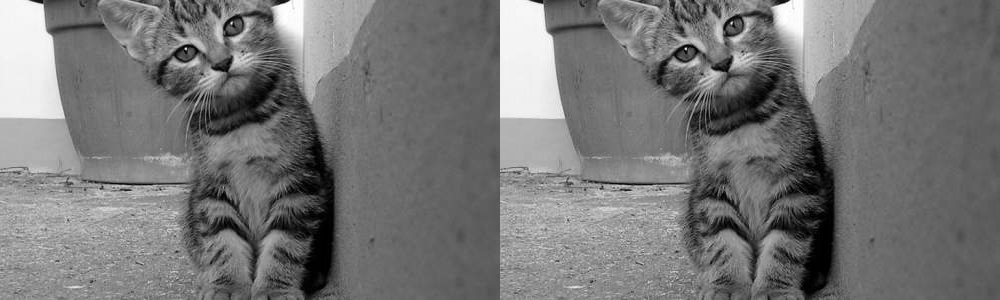

In [ ]:
gammaImg3 = gammaCorrection(myGrayImg, 1)
final_frame = cv.hconcat((myGrayImg, gammaImg3))
cv2_imshow(final_frame)

El algoritmo `gamma correction` es utilizado para controlar el brillo general de imagenes digitales, por lo que puede tener aplicaciones prácticas para el retoque de fotografías, así como para el calibrado de monitores (Cambridge in Colour, s.f.).

#**Sustracción de imágenes**
La sustracción de imágenes es una operación aritmética pixel a pixel permite obtener la diferencia en los valores de los pixeles entre múltiples imágenes. Esto tiene múltiples aplicaciones como: remover el fondo de una imagen y convertirla a formato PNG, detectar las diferencias entre dos imágenes e incluso para la creación de filtros para retocar fotografías (Geeks for Geeks, 2023).

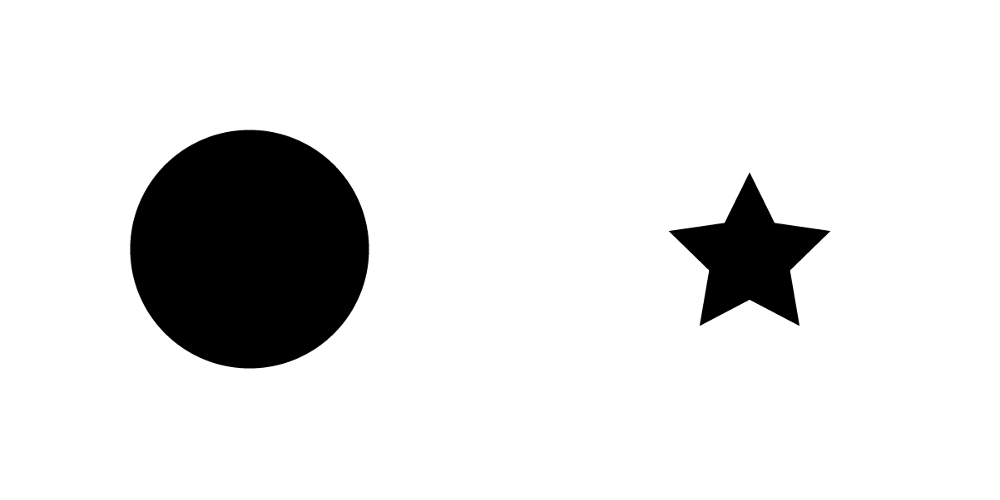

In [ ]:
# Fuente: Geeks For Geeks
# Sitio web: https://www.geeksforgeeks.org/how-to-subtract-two-images-using-python-opencv/
circleUrl = "https://media.geeksforgeeks.org/wp-content/uploads/20211001165734/circle.png"
starUrl = "https://media.geeksforgeeks.org/wp-content/uploads/20211001165739/star.png"
circle = io.imread(circleUrl)  
star = io.imread(starUrl)
final_frame = cv.hconcat((circle, star))
cv2_imshow(final_frame)

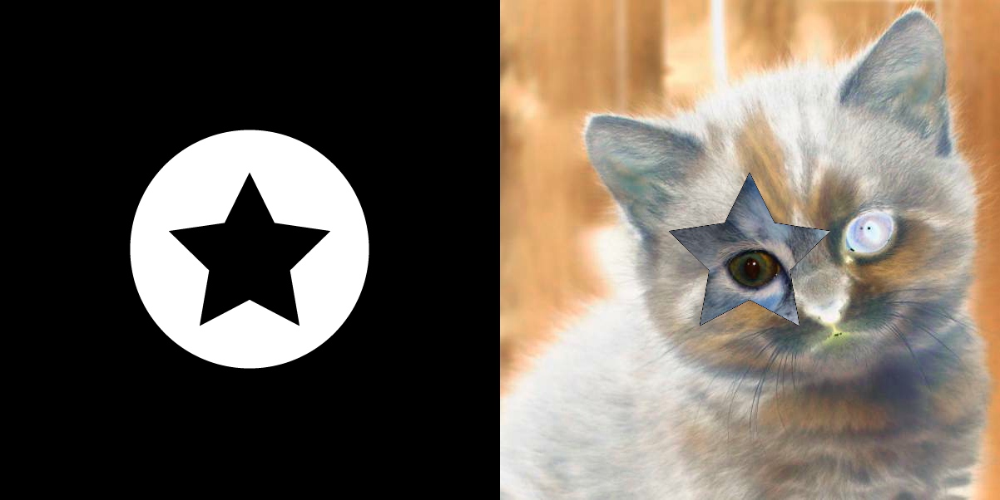

In [ ]:
# Remover canal 4 de imagenes 
# Fuente: https://stackoverflow.com/questions/36872379/how-to-remove-4th-channel-from-png-images
star = cv.cvtColor(star, cv.COLOR_BGRA2BGR)
circle = cv.cvtColor(circle, cv.COLOR_BGRA2BGR)

# Sustraer dos imágenes
# Fuente: https://stackoverflow.com/a/60291256
subtracted = cv.absdiff(circle, star)

newCatImg = io.imread('https://placekitten.com/601/602')
subtracted2 = cv.absdiff(newCatImg, star)
final_frame = cv.hconcat((subtracted, subtracted2))
cv2_imshow(final_frame)



#**Referencias**
* Geeks for Geeks. (2023). How to subtract two images using Python-OpenCV?. Fecha de consulta: 19 de enero de 2023, de Geek for Geeks Sitio web: https://www.geeksforgeeks.org/how-to-subtract-two-images-using-python-opencv/
* Lindevs. (2022). Apply Gamma Correction to an Image using OpenCV. Fecha de consulta: 19 de enero de 2023, de Lindev Sitio web: https://lindevs.com/apply-gamma-correction-to-an-image-using-opencv
* Cambridge in Colour. (s.f.). Understanding Gamma Correction. Fecha de consulta: 19 de enero de 2023, de Cambridge in Colour Sitio web: https://www.cambridgeincolour.com/tutorials/gamma-correction.htm
* The AI Learner. (s.f.). Image Negatives or inverting images using OpenCV. Fecha de consulta: 19 de enero de 2023, de The AI Learner Sitio web: https://theailearner.com/2019/01/01/image-negatives/
* Wikipedia. (s.f.). Negative (photography). Fecha de consulta: 19 de enero de 2023, de Wikipedia Sitio web: https://en.wikipedia.org/wiki/Negative_(photography)

#**2.6 Google Colab - Algoritmos de mejoramiento de imágenes basado por pixeles**

#**Histogram equalization**

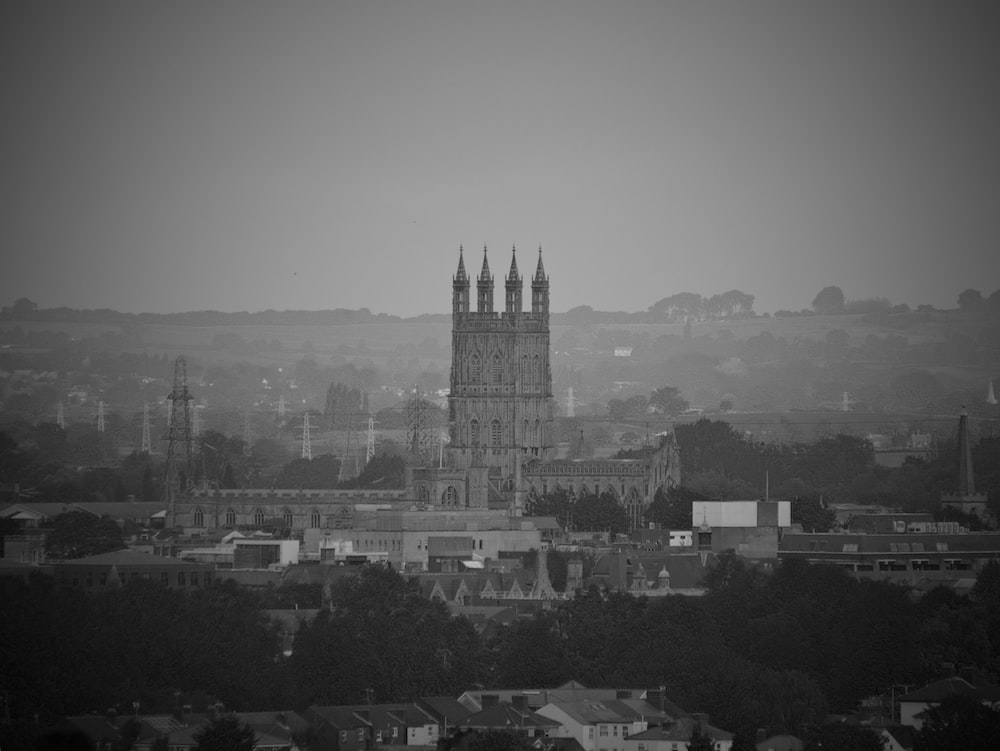

In [ ]:
src = io.imread("https://images.unsplash.com/photo-1569722177871-4ed8080b7151?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxzZWFyY2h8Mnx8bG93JTIwY29udHJhc3R8ZW58MHx8MHx8&w=1000&q=80")
src = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
cv2_imshow(src)

In [ ]:
# function of histogram equalization
def histeq(im, nbr_bins = 256):
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]



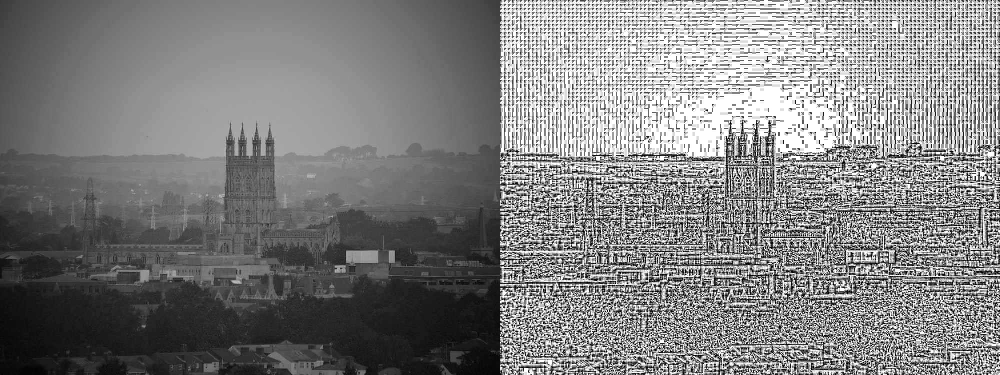

In [ ]:
def tile_histeq(img, tile_size=(8,8)):
  # Get image shape
  h, w = img.shape[:2]

  # Get number of tiles in each direction
  n_tiles_x = int(np.ceil(w / tile_size[1]))
  n_tiles_y = int(np.ceil(h / tile_size[0]))

  # Initialize output image
  img_out = np.zeros_like(img)

  # Loop over tiles
  for i in range(n_tiles_y):
    for j in range(n_tiles_x):
      # Get current tile
      x_start = j * tile_size[1]
      y_start = i * tile_size[0]
      x_end = min(x_start + tile_size[1], w)
      y_end = min(y_start + tile_size[0], h)
      tile = img[y_start:y_end, x_start:x_end]

      # Perform histogram equalization on the tile
      hist, bin_edges = np.histogram(tile, bins=256, range=(0, 256))
      cdf = hist.cumsum()
      cdf = 255 * cdf / cdf[-1]
      img_out[y_start:y_end, x_start:x_end] = np.interp(img[y_start:y_end, x_start:x_end], bin_edges[:-1], cdf)
  return img_out

dst_tile_histeq = tile_histeq(src, tile_size=(8, 8))
final_frame = cv.hconcat((src, dst_tile_histeq))
cv2_imshow(final_frame)
  

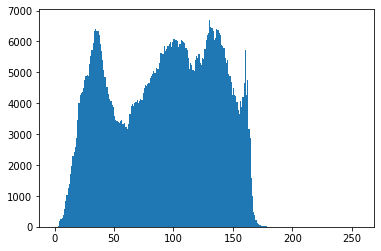

In [ ]:
plt.hist(src.ravel(),bins = 256, range = [0, 256])
plt.show()

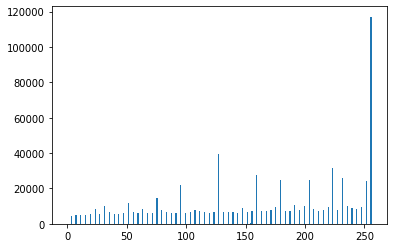

In [ ]:
plt.hist(dst_tile_histeq.ravel(),bins = 256, range = [0, 256])
plt.show()

#**Sliding Window Adaptive Histogram Equalization (SWAHE)**

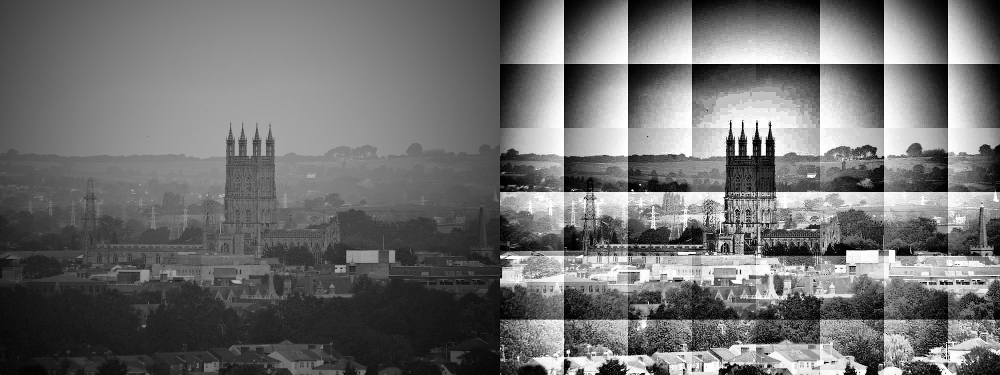

In [ ]:
def SWAHE(image, window_size=128, nbr_bins=256):
  rows, cols = image.shape
  window = (window_size, window_size)
  image_swahe = np.zeros_like(image)
  
  for i in range(0, rows, window_size):
    for j in range(0, cols, window_size):
      window_image = image[i:i + window[0], j:j+window[1]]
      imhist, bins = np.histogram(window_image.flatten(), nbr_bins, [0, 256])
      cdf = imhist.cumsum()
      cdf_mask = np.ma.masked_equal(cdf, 0)
      cdf_mask = (cdf_mask - cdf.min()) * 255 / (cdf_mask.max() - cdf_mask.min())
      cdf = np.ma.filled(cdf_mask,0).astype('uint8')
      window_image = cdf[window_image]
      image_swahe[i:i+window[0], j:j+window[1]] = window_image
  return image_swahe

dst_swahe = SWAHE(src, window_size=128)
final_frame = cv.hconcat((src, dst_swahe))
cv2_imshow(final_frame)

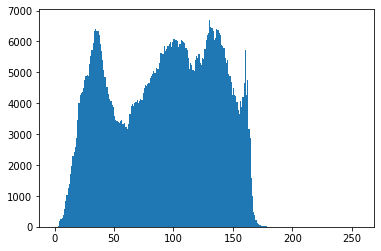

In [ ]:
plt.hist(src.ravel(),bins = 256, range = [0, 256])
plt.show()

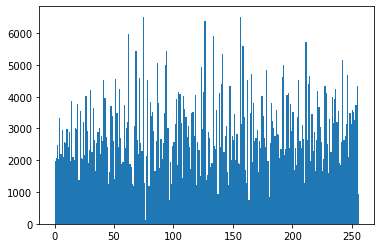

In [ ]:
plt.hist(dst_swahe.ravel(),bins = 256, range = [0, 256])
plt.show()

#**Contrast Limited Adaptive Histogram Equalization (CLAHE)**

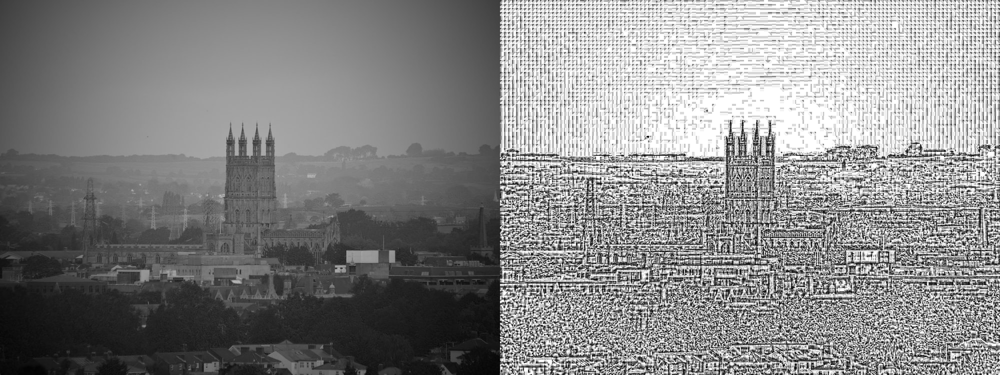

In [ ]:
def CLAHE(img, clip_limit=2.0, tile_size=(8,8)):
    # Get image shape
    h, w = img.shape[:2]

    # Get number of tiles in each direction
    n_tiles_x = int(np.ceil(w / tile_size[1]))
    n_tiles_y = int(np.ceil(h / tile_size[0]))

    # Initialize output image
    img_out = np.zeros_like(img)

    # Loop over tiles
    for i in range(n_tiles_y):
        for j in range(n_tiles_x):
            # Get current tile
            x_start = j * tile_size[1]
            y_start = i * tile_size[0]
            x_end = min(x_start + tile_size[1], w)
            y_end = min(y_start + tile_size[0], h)
            tile = img[y_start:y_end, x_start:x_end]

            # Perform histogram equalization on the tile
            hist, bin_edges = np.histogram(tile, bins=256, range=(0, 256))
            cdf = hist.cumsum()
            cdf = 255 * cdf / cdf[-1]

            # Clip the histogram and redistribute the excess mass
            hist_clip = np.minimum(hist, clip_limit * np.amax(hist))
            cdf_clip = hist_clip.cumsum()
            cdf_clip = 255 * cdf_clip / cdf_clip[-1]

            img_out[y_start:y_end, x_start:x_end] = np.interp(img[y_start:y_end, x_start:x_end], bin_edges[:-1], cdf_clip)

    return img_out

dst_clahe = CLAHE(src)
final_frame = cv.hconcat((src, dst_clahe))
cv2_imshow(final_frame)

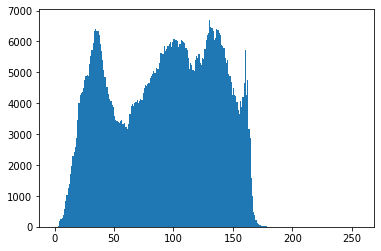

In [ ]:
plt.hist(src.ravel(),bins = 256, range = [0, 256])
plt.show()

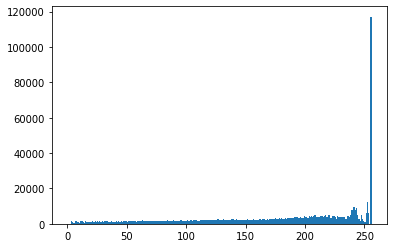

In [ ]:
plt.hist(dst_clahe.ravel(),bins = 256, range = [0, 256])
plt.show()